In [10]:
import numpy as np
import matplotlib.pyplot as plt
import qutip
from qutip import *
from qutip_qip.operations import *
from qutip_qip.circuit import QubitCircuit, Gate

import ipywidgets as widgets
from IPython.display import display
import numpy as np
! pip install qutip # for Google Colab
from qutip import (
    Qobj,
    QobjEvo,
    Bloch,
    basis,
    sigmax,
    sigmay,
    sigmaz,
    qeye,
    mesolve,
    expect
)
import matplotlib.pyplot as plt

In [11]:
import sympy as sp

omega = sp.symbols('omega')

M = sp.Matrix([[0, -omega, 0],
               [omega, 0, 0],
               [0, 0, 0]])

eigenvalues = M.eigenvals()
eigenvectors = M.eigenvects()

# Afficher les résultats
print("Eigenvalues:")
print(eigenvalues)
for vect in eigenvectors:
    print(f"Eigenvectors: {vect}")


Eigenvalues:
{-I*omega: 1, I*omega: 1, 0: 1}
Eigenvectors: (0, 1, [Matrix([
[0],
[0],
[1]])])
Eigenvectors: (-I*omega, 1, [Matrix([
[-I],
[ 1],
[ 0]])])
Eigenvectors: (I*omega, 1, [Matrix([
[I],
[1],
[0]])])


In [12]:
import sympy as sp
omega, t = sp.symbols('omega t')

# Définir la matrice M
M = sp.Matrix([[0, -omega, 0],
               [omega, 0, 0],
               [0, 0, 0]])

# Calculer l'exponentielle de la matrice M * t
exp_M_t = sp.exp(M * t)

# Afficher le résultat
exp_M_t


Matrix([
[     exp(I*omega*t)/2 + exp(-I*omega*t)/2, I*exp(I*omega*t)/2 - I*exp(-I*omega*t)/2, 0],
[-I*exp(I*omega*t)/2 + I*exp(-I*omega*t)/2,     exp(I*omega*t)/2 + exp(-I*omega*t)/2, 0],
[                                        0,                                        0, 1]])

In [13]:
#Question 24 Hamiltonien de X et Z en meme temps
import sympy as sp
omega_x, omega_y, omega_z, t = sp.symbols('omega_x omega_z omega_z t')
I = sp.I 
tau1 = sp.pi/sp.sqrt(omega_z**2+omega_x**2)
tau2 = sp.pi/omega_z

sigma_x = sp.Matrix([[0, 1], [1, 0]])
sigma_y = sp.Matrix([[0, -I], [I, 0]])
sigma_z = sp.Matrix([[1, 0], [0, -1]])
psi00 = sp.Matrix([[1], [0]])

# Calculer l'exponentielle de la matrice M * t
H = -0*omega_z/10 * sigma_x/2 - 0 * omega_y * sigma_y/2 - omega_z * sigma_z/2
U = sp.exp(-I * H * t)
psi_t=U @ psi00
eigenvalues = H.eigenvals()
eigenvectors = H.eigenvects()

# Afficher les résultats
print("Eigenvalues:")
print(eigenvalues)
for vect in eigenvectors:
    print(f"Eigenvectors: {vect}")

# Afficher le résultat
U

Eigenvalues:
{-omega_z/2: 1, omega_z/2: 1}
Eigenvectors: (-omega_z/2, 1, [Matrix([
[1],
[0]])])
Eigenvectors: (omega_z/2, 1, [Matrix([
[0],
[1]])])


Matrix([
[exp(I*omega_z*t/2),                   0],
[                 0, exp(-I*omega_z*t/2)]])

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import sympy as sp

# Here we define the symbols and the value of omega
t = sp.symbols('t')
x0, y0, z0 = sp.symbols('x0 y0 z0')
omega=1

# We then define the matrix M
M = sp.Matrix([[0, -omega, omega],
               [omega, 0, -omega],
               [-omega, omega, 0]])

# Exponential of the matrix M times the time variable
exp_M_t = sp.exp(M * t)
exp_M_t_simplified = exp_M_t.simplify()

# Definition of initial conditions as variable
initial_conditions = sp.Matrix([x0, y0, z0])

# Analytic solution of the system
result_vector = exp_M_t_simplified * initial_conditions

# Extraction of x(t), y(t), z(t)
x_t, y_t, z_t = result_vector[0].simplify(), result_vector[1].simplify(), result_vector[2].simplify()

In [15]:
# Printing exp(M*t)
exp_M_t_simplified

Matrix([
[                                                                      2*cos(sqrt(3)*t)/3 + 1/3,         (1 + sqrt(3)*I)**2*exp(sqrt(3)*I*t)/12 + 1/3 + (1 - sqrt(3)*I)**2*exp(-sqrt(3)*I*t)/12, ((-(1 + sqrt(3)*I)*exp(sqrt(3)*I*t) + 2)*exp(sqrt(3)*I*t) - 1 + sqrt(3)*I)*exp(-sqrt(3)*I*t)/6],
[        (1 - sqrt(3)*I)**2*exp(sqrt(3)*I*t)/12 + 1/3 + (1 + sqrt(3)*I)**2*exp(-sqrt(3)*I*t)/12,                                                                       2*cos(sqrt(3)*t)/3 + 1/3, (((-1 + sqrt(3)*I)*exp(sqrt(3)*I*t) + 2)*exp(sqrt(3)*I*t) - 1 - sqrt(3)*I)*exp(-sqrt(3)*I*t)/6],
[(((-1 + sqrt(3)*I)*exp(sqrt(3)*I*t) + 2)*exp(sqrt(3)*I*t) - 1 - sqrt(3)*I)*exp(-sqrt(3)*I*t)/6, ((-(1 + sqrt(3)*I)*exp(sqrt(3)*I*t) + 2)*exp(sqrt(3)*I*t) - 1 + sqrt(3)*I)*exp(-sqrt(3)*I*t)/6,                                                                       2*cos(sqrt(3)*t)/3 + 1/3]])

In [16]:
# Printing x(t)
x_t

(4*x0*(2*cos(sqrt(3)*t) + 1)*exp(sqrt(3)*I*t) + y0*(((1 + sqrt(3)*I)**2*exp(sqrt(3)*I*t) + 4)*exp(sqrt(3)*I*t) + (1 - sqrt(3)*I)**2) - 2*z0*(((1 + sqrt(3)*I)*exp(sqrt(3)*I*t) - 2)*exp(sqrt(3)*I*t) + 1 - sqrt(3)*I))*exp(-sqrt(3)*I*t)/12

In [17]:
# Printing y(t)
y_t

(x0*(((1 - sqrt(3)*I)**2*exp(sqrt(3)*I*t) + 4)*exp(sqrt(3)*I*t) + (1 + sqrt(3)*I)**2) + 4*y0*(2*cos(sqrt(3)*t) + 1)*exp(sqrt(3)*I*t) - 2*z0*(((1 - sqrt(3)*I)*exp(sqrt(3)*I*t) - 2)*exp(sqrt(3)*I*t) + 1 + sqrt(3)*I))*exp(-sqrt(3)*I*t)/12

In [18]:
# Printing z(t)
z_t

(-x0*(((1 - sqrt(3)*I)*exp(sqrt(3)*I*t) - 2)*exp(sqrt(3)*I*t) + 1 + sqrt(3)*I) - y0*(((1 + sqrt(3)*I)*exp(sqrt(3)*I*t) - 2)*exp(sqrt(3)*I*t) + 1 - sqrt(3)*I) + 2*z0*(2*cos(sqrt(3)*t) + 1)*exp(sqrt(3)*I*t))*exp(-sqrt(3)*I*t)/6

In [19]:
#Question 28 Hamiltonien avec rotating transform
import sympy as sp
g, omega_x, omega_y, omega_z, t = sp.symbols('g omega_x omega_z omega_z t')
I = sp.I 
tau = sp.pi/omega_z

sigma_x = sp.Matrix([[0, 1], [1, 0]])
sigma_y = sp.Matrix([[0, -I], [I, 0]])
sigma_z = sp.Matrix([[1, 0], [0, -1]])
psi00 = sp.Matrix([[1], [0]])


H = -g * sigma_x/2 - 0 * omega_y * sigma_y/2 - omega_z * sigma_z/2
U = sp.exp(-I * omega_z * t * sigma_z/2)
U_dagger= sp.Matrix([[sp.exp(I*omega_z*t/2), 0], [0, sp.exp(-I*omega_z*t/2)]])
U_point = sp.Matrix([[-I*omega_z/2 *sp.exp(-I*omega_z*t/2), 0], [0, I*omega_z/2 *sp.exp(I*omega_z*t/2)]])

H_new = U @ H @ U_dagger + I * U_point @ U_dagger
U_new = sp.exp(-I * H_new * t)
eigenvalues = H.eigenvals()
eigenvectors = H.eigenvects()

# Afficher les résultats
print("Eigenvalues:")
print(eigenvalues)
for vect in eigenvectors:
    print(f"Eigenvectors: {vect}")

# Print result
H_new
U_new
U_new @ psi00

Eigenvalues:
{-sqrt(g**2 + omega_z**2)/2: 1, sqrt(g**2 + omega_z**2)/2: 1}
Eigenvectors: (-sqrt(g**2 + omega_z**2)/2, 1, [Matrix([
[omega_z/g + sqrt(g**2 + omega_z**2)/g],
[                                    1]])])
Eigenvectors: (sqrt(g**2 + omega_z**2)/2, 1, [Matrix([
[omega_z/g - sqrt(g**2 + omega_z**2)/g],
[                                    1]])])


Matrix([
[                                  exp(I*g*t/2)/2 + exp(-I*g*t/2)/2],
[exp(I*g*t/2)*exp(I*omega_z*t)/2 - exp(-I*g*t/2)*exp(I*omega_z*t)/2]])

In [44]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display
from qutip import Bloch, basis
import numpy as np
import matplotlib as mpl
from matplotlib import cm

# Fonction pour mettre à jour la sphère de Bloch à chaque étape
def update_bloch(num, states, b, colors):
    b.clear()  # Efface la sphère à chaque étape
    b.vector_color = ['r']  # Définir la couleur de la flèche du vecteur d'onde
    b.add_states(states[num])  # Ajoute le vecteur d'état actuel (flèche)
    # Ajoute tous les états précédents sous forme de points colorés
    for i in range(num + 1):
        b.point_color = [colors[i]]  # Couleur du point correspondant à l'étape
        b.add_states(states[i], 'point')
    b.make_sphere()

# Fonction pour animer la sphère de Bloch
def animate_bloch(states, interval=200):
    b = Bloch()
    fig, ax = plt.subplots(subplot_kw={'projection': '3d'})  # Bloch sphere needs a 3D plot
    b.fig = fig  # Attache la figure à l'objet Bloch

    # Génère les couleurs en fonction du nombre d'états
    norm = mpl.colors.Normalize(0, len(states))
    colors = cm.cool(norm(range(len(states))))  # Options de couleur : cool, summer, winter, autumn, etc.

    # Fonction de mise à jour pour l'animation
    anim = FuncAnimation(fig, update_bloch, frames=len(states), fargs=(states, b, colors), interval=interval)

    # Affichage de l'animation dans le notebook
    plt.close(fig)  # Ferme la figure pour éviter un affichage vide
    return HTML(anim.to_jshtml())

# Générer les états pour l'animation
states = []
thetas = np.linspace(0, 2*np.pi, )
for theta in thetas:
    states.append((np.cos(theta/2)*basis(2, 0) + np.sin(theta/2)*basis(2, 1)).unit())

# Appeler la fonction pour animer
display(animate_bloch(states))


Eigenvalues: [-0.8660254  0.8660254]
Frequency: 0.27566444771089604
Period: 3.6275987284684357


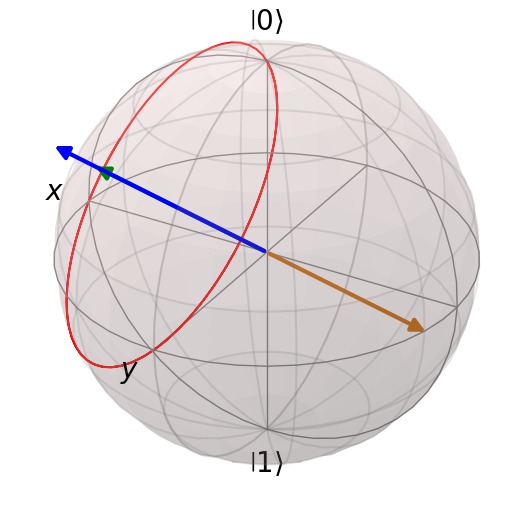

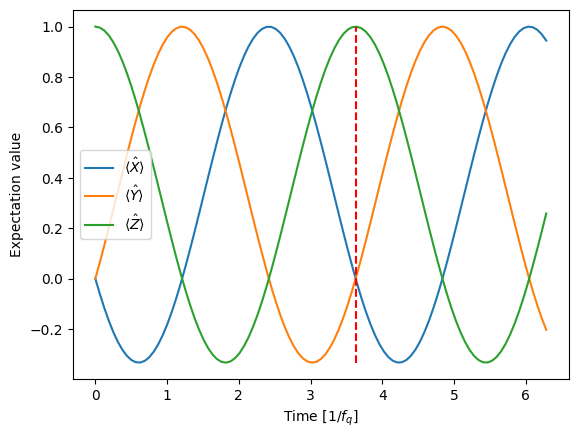

In [55]:
##Question 15

# define a arbitrary Hamiltonian in 2-D Hilbert space
omega_x = 1
omega_y = 1
omega_z = 1
H = -omega_x * sigmax()/2 - omega_y * sigmay()/2 - omega_z * sigmaz()/2

# diagonalization of Hamiltonian
eigvals, eigstates = H.eigenstates()
print("Eigenvalues:", eigvals)
freq_rotate = (eigvals[1] - eigvals[0]) / (2 * np.pi)  # frequency of rotation scale from rad*Hz to Hz
print("Frequency:", freq_rotate)
period = 1 / freq_rotate
print("Period:", period)

time_list = np.linspace(0, 2 * np.pi, 101)  # [2\pi / omega_z] time points normalized by qubit freq

# definition of the initial state (|0> state)
psi0 = basis(2, 0)

# solve the Schrodinger equation
result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()])

# plot the time evolution of bloch vector
exp_x = result.expect[0]
exp_y = result.expect[1]
exp_z = result.expect[2]

plt.plot(time_list, exp_x, label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y, label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z, label=r"$\langle\hat{Z}\rangle$")

# plot the vertical line at the period of the rotation
plt.vlines(period, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="red")

plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")

# plot on Bloch sphere
b = Bloch()

# Set the desired perspective on the Bloch sphere
b.view = [30, 30]  # Change the numbers to set the azimuth and elevation angles

b.make_sphere()

# plot the time trace of the state
b.add_points(result.expect, meth="l", colors="red")

# plot the rotation angle (eigenstates of the Hamiltonian)
b.add_states(eigstates)
vec = [1,1,1]/np.sqrt(2)
b.add_vectors(vec)

b.render()
b.show()


In [56]:
#Question 10
def transformation (wx,wy,wz,psi0,t_target) :
    # define a arbitrary Hamiltonian in 2-D Hilbert space
    omega_x = wx
    omega_y = wy
    omega_z = wz
    H = -omega_x * sigmax()/2 - omega_y * sigmay()/2 - omega_z * sigmaz()/2
    
    # diagonalization of Hamiltonian
    eigvals, eigstates = H.eigenstates()
    print("Eigenvalues:", eigvals)
    freq_rotate = (eigvals[1] - eigvals[0]) / (2 * np.pi)  # frequency of rotation scale from rad*Hz to Hz
    print("Frequency:", freq_rotate)
    period = 1 / freq_rotate
    print("Period:", period)
    
    time_list = np.linspace(0, 2 * np.pi, 101)  # [2\pi / omega_z] time points normalized by qubit freq. attention peut etre divisé par wz
    
    # definition of the initial state (|0> state)
    
    # solve the Schrodinger equation
    result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()])
    
    # plot the time evolution of bloch vector
    exp_x = result.expect[0]
    exp_y = result.expect[1]
    exp_z = result.expect[2]
    
    plt.plot(time_list, exp_x, label=r"$\langle\hat{X}\rangle$")
    plt.plot(time_list, exp_y, label=r"$\langle\hat{Y}\rangle$")
    plt.plot(time_list, exp_z, label=r"$\langle\hat{Z}\rangle$")
    
    # plot the vertical line at the period of the rotation
    plt.vlines(period, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="red")
    
    plt.legend(loc=0)
    plt.xlabel(r"Time [1/$f_q$]")
    plt.ylabel("Expectation value")
    
    # plot on Bloch sphere
    b = Bloch()
    
    # Set the desired perspective on the Bloch sphere
    b.view = [30, 30]  # Change the numbers to set the azimuth and elevation angles
    
    b.make_sphere()
    
    # plot the time trace of the state
    b.add_points(result.expect, meth="l", colors="red")
    
    # Ajoutez le point target du vecteur de Bloch sur la sphère de Bloch
    index_target = (np.abs(time_list - t_target)).argmin()
    b.add_points([[exp_x[index_target]], [exp_y[index_target]], [exp_z[index_target]]], meth="m", colors="blue")

    # plot the rotation angle (eigenstates of the Hamiltonian)
    b.add_states(eigstates)
    if (exp_x[index_target] > 0.9 and -0.1 < exp_y[index_target] < 0.1 and -0.1 < exp_z[index_target] < 0.1) :
        x0 = (basis(2,0)+(1+0j)*basis(2,1)).unit()
        b.add_states([x0])
    elif (exp_x[index_target] < -0.9 and -0.1 < exp_y[index_target] < 0.1 and -0.1 < exp_z[index_target] < 0.1) :
        x1 = (basis(2,0)-(1+0j)*basis(2,1)).unit()
        b.add_states([x1])
    if (exp_y[index_target] > 0.9 and -0.1 < exp_x[index_target] < 0.1 and -0.1 < exp_z[index_target] < 0.1) :
        y0 = (basis(2,0)+(0+1j)*basis(2,1)).unit()
        b.add_states([y0])
    elif (exp_y[index_target] < -0.9 and -0.1 < exp_x[index_target] < 0.1 and -0.1 < exp_z[index_target] < 0.1) :
        y1 = (basis(2,0)-(0+1j)*basis(2,1)).unit()
        b.add_states([y1])
    if (exp_z[index_target] > 0.9 and -0.1 < exp_x[index_target] < 0.1 and -0.1 < exp_y[index_target] < 0.1) :
        z0 = (basis(2,0)+(0+0j)*basis(2,1)).unit()
        b.add_states([z0])
    elif (exp_z[index_target] < -0.9 and -0.1 < exp_x[index_target] < 0.1 and -0.1 < exp_y[index_target] < 0.1) :
        z1 = (0*basis(2,0)+(1+0j)*basis(2,1)).unit()
        b.add_states([z1])
    
    b.render()
    b.show()
    print(f"Expectation value for X at the time t = t_target: {exp_x[index_target]}")  
    print(f"Expectation value for Y at the last t = t_target: {exp_y[index_target]}")  
    print(f"Expectation value for Z at the last t = t_target: {exp_z[index_target]}")
    return 

#transformation (wx=0,wy=1,wz=0,psi0=basis(2, 0),t_target=np.mod(2*np.pi/2, 2 * np.pi)) #faire mod 4π/omega_y si on ne vuet pas que les valeurs sortent de l'intervale

In [57]:
#Question 20
#transformation (wx=1,wy=0,wz=0,psi0=basis(2, 0),t_target=np.mod(3*np.pi/2, 2 * np.pi))

Eigenvalues: [-0.5  0.5]
Frequency: 0.15915494309189535
Period: 6.283185307179586


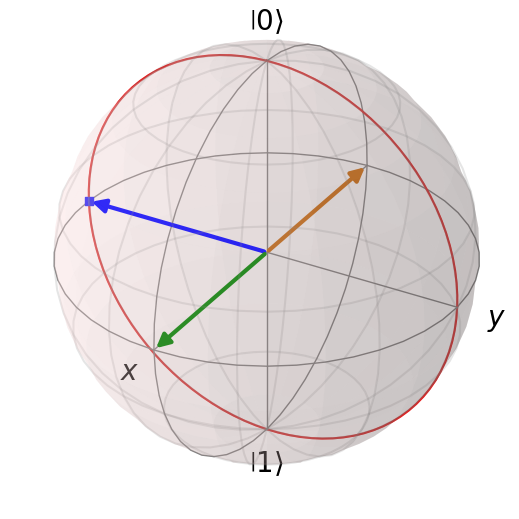

t_target = 4.71238898038469
Expectation value for X at the time t = t_target: 0.0
Expectation value for Y at the time t = t_target: -0.9999999999960397
Expectation value for Z at the time t = t_target: 2.814257600070036e-06


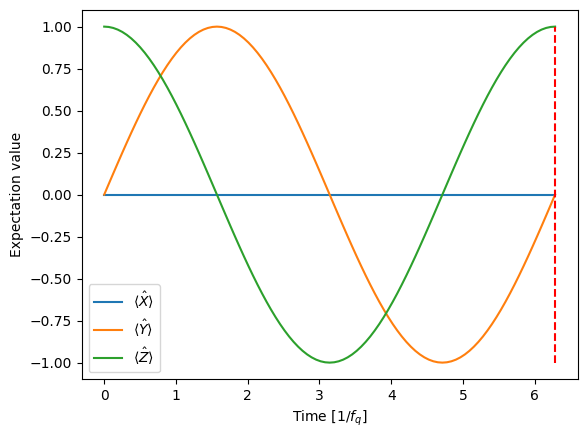

In [58]:
#Question ALTERNATIVE 19 et 20 ou c'est le temps qui est trouvé
def transformation(wx, wy, wz, psi0,basis_observed,value_observed):
    # Define a arbitrary Hamiltonian in 2-D Hilbert space
    omega_x = wx
    omega_y = wy
    omega_z = wz
    H = -omega_x * sigmax()/2 - omega_y * sigmay()/2 - omega_z * sigmaz()/2
    
    # Diagonalization of Hamiltonian
    eigvals, eigstates = H.eigenstates()
    print("Eigenvalues:", eigvals)
    freq_rotate = (eigvals[1] - eigvals[0]) / (2 * np.pi)  # Frequency of rotation scale from rad*Hz to Hz
    print("Frequency:", freq_rotate)
    period = 1 / freq_rotate
    print("Period:", period)
    
    time_list = np.linspace(0, 2 * np.pi, 101)  # [2π / ω_z] time points normalized by qubit frequency
    
    # Solve the Schrodinger equation
    result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()])
    
    # Extract the expectation values
    exp_x = result.expect[0]
    exp_y = result.expect[1]
    exp_z = result.expect[2]
    
    # Find the index where exp_z is closest to -1
    if (basis_observed == 'z' and value_observed ==-1) :
        index_target = (np.abs(exp_z + 1)).argmin()
        t_target = time_list[index_target]
    elif (basis_observed == 'z' and value_observed ==+1) :
        index_target = (np.abs(exp_z + 1)).argmax()
        t_target = time_list[index_target]
    if (basis_observed == 'x' and value_observed ==-1) :
        index_target = (np.abs(exp_x + 1)).argmin()
        t_target = time_list[index_target]
    elif (basis_observed == 'x' and value_observed ==+1) :
        index_target = (np.abs(exp_x + 1)).argmax()
        t_target = time_list[index_target]
    if (basis_observed == 'y' and value_observed ==-1) :
        index_target = (np.abs(exp_y + 1)).argmin()
        t_target = time_list[index_target]
    elif (basis_observed == 'y' and value_observed ==+1) :
        index_target = (np.abs(exp_y + 1)).argmax()
        t_target = time_list[index_target]
    
    # Plot the time evolution of the Bloch vector
    plt.plot(time_list, exp_x, label=r"$\langle\hat{X}\rangle$")
    plt.plot(time_list, exp_y, label=r"$\langle\hat{Y}\rangle$")
    plt.plot(time_list, exp_z, label=r"$\langle\hat{Z}\rangle$")
    
    # Plot the vertical line at the period of the rotation
    plt.vlines(period, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="red")
    
    plt.legend(loc=0)
    plt.xlabel(r"Time [1/$f_q$]")
    plt.ylabel("Expectation value")
    
    # Plot on Bloch sphere
    b = Bloch()
    #b.view = [30, 30]  # Set the desired perspective on the Bloch sphere
    #b.view = [-45, 30]
    b.make_sphere()
    
    # Plot the time trace of the state
    b.add_points(result.expect, meth="l", colors="red")
    
    # Add the point at the target time on the Bloch sphere
    b.add_points([[exp_x[index_target]], [exp_y[index_target]], [exp_z[index_target]]], meth="m", colors="blue")
    
    # Plot the rotation angle (eigenstates of the Hamiltonian)
    b.add_states(eigstates)
    if (exp_x[index_target] > 0.9 and -0.1 < exp_y[index_target] < 0.1 and -0.1 < exp_z[index_target] < 0.1) :
        x0 = (basis(2,0)+(1+0j)*basis(2,1)).unit()
        b.add_states([x0])
    elif (exp_x[index_target] < -0.9 and -0.1 < exp_y[index_target] < 0.1 and -0.1 < exp_z[index_target] < 0.1) :
        x1 = (basis(2,0)-(1+0j)*basis(2,1)).unit()
        b.add_states([x1])
    if (exp_y[index_target] > 0.9 and -0.1 < exp_x[index_target] < 0.1 and -0.1 < exp_z[index_target] < 0.1) :
        y0 = (basis(2,0)+(0+1j)*basis(2,1)).unit()
        b.add_states([y0])
    elif (exp_y[index_target] < -0.9 and -0.1 < exp_x[index_target] < 0.1 and -0.1 < exp_z[index_target] < 0.1) :
        y1 = (basis(2,0)-(0+1j)*basis(2,1)).unit()
        b.add_states([y1])
    if (exp_z[index_target] > 0.9 and -0.1 < exp_x[index_target] < 0.1 and -0.1 < exp_y[index_target] < 0.1) :
        z0 = (basis(2,0)+(0+0j)*basis(2,1)).unit()
        b.add_states([z0])
    elif (exp_z[index_target] < -0.9 and -0.1 < exp_x[index_target] < 0.1 and -0.1 < exp_y[index_target] < 0.1) :
        z1 = (0*basis(2,0)+(1+0j)*basis(2,1)).unit()
        b.add_states([z1])
    b.render()
    b.show()
    
    print(f"t_target = {t_target}")
    print(f"Expectation value for X at the time t = t_target: {exp_x[index_target]}")  
    print(f"Expectation value for Y at the time t = t_target: {exp_y[index_target]}")  
    print(f"Expectation value for Z at the time t = t_target: {exp_z[index_target]}")
    return

# Call the function without manually setting t_target
transformation(wx=1, wy=0, wz=0, psi0=basis(2, 0),basis_observed='y',value_observed=-1)

Eigenvalues: [-0.70710678  0.70710678]
Frequency: 0.22507907903927654
Period: 4.442882938158366


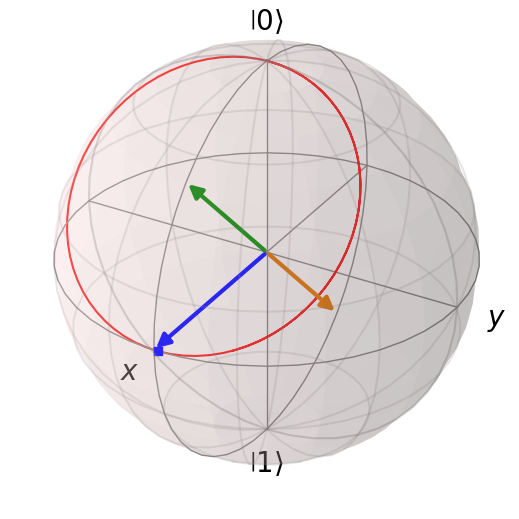

t_target = 2.199114857512855
Expectation value for X at the time t = t_target: 0.9997508048866227
Expectation value for Y at the time t = t_target: 0.02232187336102123
Expectation value for Z at the time t = t_target: 0.0002491951133772319


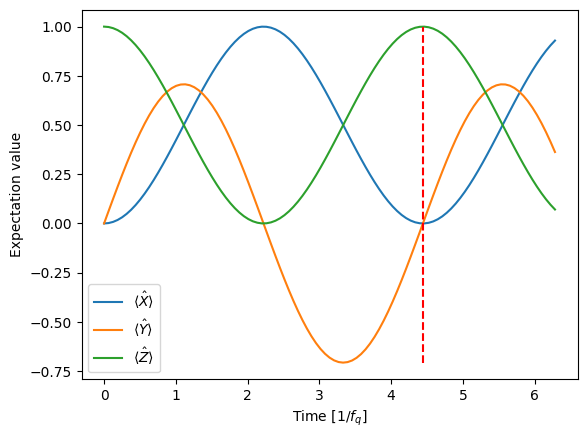

In [25]:
#Question 21
transformation(wx=1, wy=0, wz=1, psi0=basis(2, 0),basis_observed='x',value_observed=1)

Eigenvalues: [-0.55901699  0.55901699]
Frequency: 0.1779406358542943
Period: 5.61985178483258


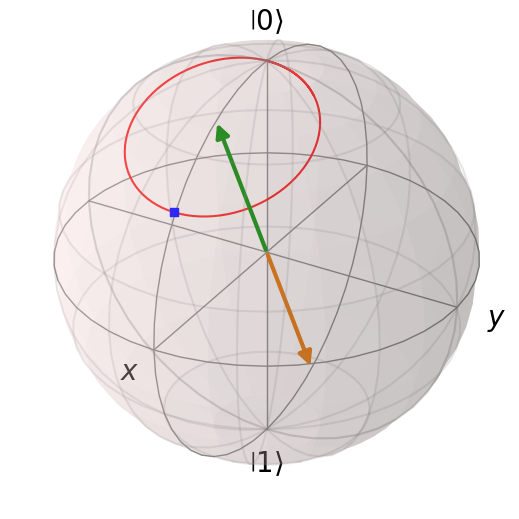

t_target = 2.8274333882308142
Expectation value for X at the time t = t_target: 0.7999233622037856
Expectation value for Y at the time t = t_target: -0.00875388225443899
Expectation value for Z at the time t = t_target: 0.6000383188981071


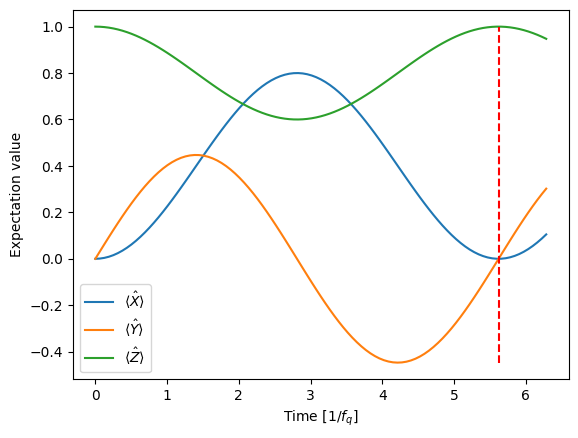

In [26]:
transformation(wx=0.5, wy=0, wz=1, psi0=basis(2, 0),basis_observed='x',value_observed=1)

Eigenvalues: [-0.50062461  0.50062461]
Frequency: 0.15935376258614325
Period: 6.27534602114852


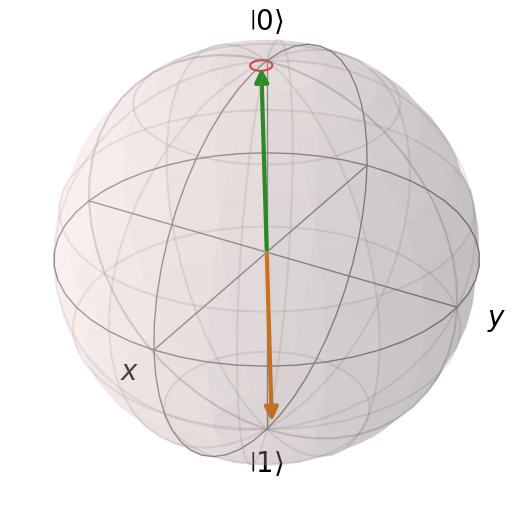

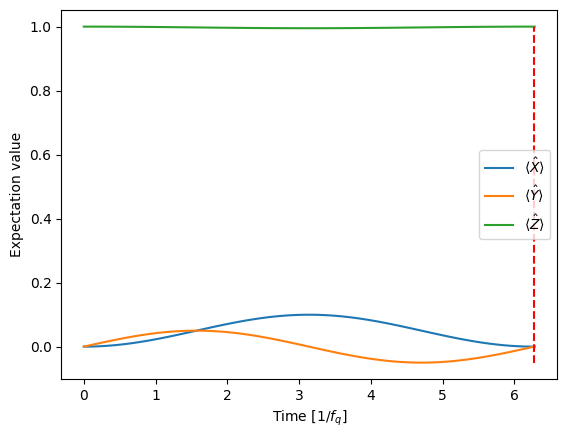

In [27]:
#Question 23
def transformation(wx, wy, wz, psi0) :
    # Define a arbitrary Hamiltonian in 2-D Hilbert space
    omega_x = wx
    omega_y = wy
    omega_z = wz
    H = -omega_x * sigmax()/2 - omega_y * sigmay()/2 - omega_z * sigmaz()/2
    
    # Diagonalization of Hamiltonian
    eigvals, eigstates = H.eigenstates()
    print("Eigenvalues:", eigvals)
    freq_rotate = (eigvals[1] - eigvals[0]) / (2 * np.pi)  # Frequency of rotation scale from rad*Hz to Hz
    print("Frequency:", freq_rotate)
    period = 1 / freq_rotate
    print("Period:", period)
    
    time_list = np.linspace(0, 2 * np.pi, 101)  # [2π / ω_z] time points normalized by qubit frequency
    
    # Solve the Schrodinger equation
    result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()])
    
    # Extract the expectation values
    exp_x = result.expect[0]
    exp_y = result.expect[1]
    exp_z = result.expect[2]
    
    # Plot the time evolution of the Bloch vector
    plt.plot(time_list, exp_x, label=r"$\langle\hat{X}\rangle$")
    plt.plot(time_list, exp_y, label=r"$\langle\hat{Y}\rangle$")
    plt.plot(time_list, exp_z, label=r"$\langle\hat{Z}\rangle$")
    
    # Plot the vertical line at the period of the rotation
    plt.vlines(period, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="red")
    
    plt.legend(loc=0)
    plt.xlabel(r"Time [1/$f_q$]")
    plt.ylabel("Expectation value")
    
    # Plot on Bloch sphere
    b = Bloch()
    #b.view = [30, 30]  # Set the desired perspective on the Bloch sphere
    #b.view = [-45, 30]
    b.make_sphere()
    
    # Plot the time trace of the state
    b.add_points(result.expect, meth="l", colors="red")
    
    # Plot the rotation angle (eigenstates of the Hamiltonian)
    b.add_states(eigstates)
    b.render()
    b.show()
    return

# Call the function without manually setting t_target
transformation(wx=0.05, wy=0, wz=1, psi0=basis(2, 0))

Le temps pour atteindre le plan XY est :  7.371428571428572


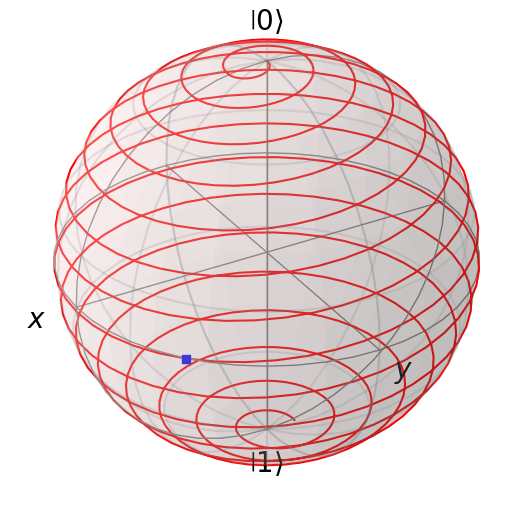

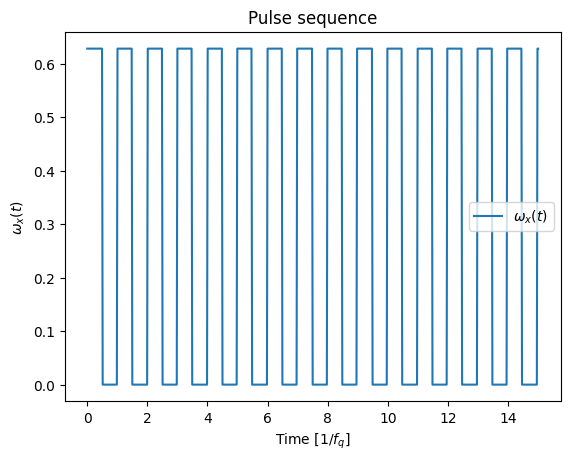

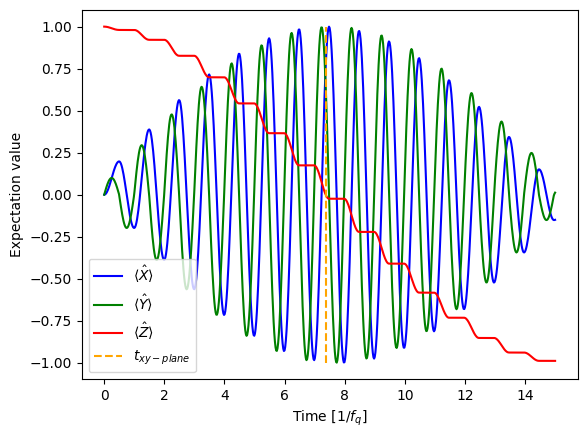

In [60]:
#Question 24
omega_z = 2*np.pi
time_list = np.linspace(0, 15, 701) 
g = omega_z/10
tau1 = np.pi/np.sqrt(omega_z**2+g**2)
tau2 = np.pi/omega_z

# Definition of the pulse shape (omega_x(t))
def omega_x(t):
    tau = tau1 + tau2
    n=int(t//tau)
    if t < n*tau+tau1:
        return g
    else:
        return 0

# Definition of the time-dependent Hamiltonian
H0 = -omega_z / 2 * sigmaz()
H1 = -1 / 2 * sigmax()
H = [H0, [H1, omega_x]]

# solve the Schrodinger equation
result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()],options={"store_states":True})

# plot the pulse sequence shape (omega_x(t))
plt.plot(time_list, [omega_x(t) for t in time_list],label=r"$\omega_x(t)$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel(r"$\omega_x(t)$")
plt.title("Pulse sequence")

# plot the time evolution of bloch vector
exp_x = result.expect[0]
exp_y = result.expect[1]
exp_z = result.expect[2]

#Find time when XY plane is reached
index_plane = (np.abs(exp_z)).argmin()
t_xyplane = time_list[index_plane]
print("Le temps pour atteindre le plan XY est : ", t_xyplane)

plt.figure()
plt.plot(time_list, exp_x, color="blue", label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y, color="green", label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z, color="red", label=r"$\langle\hat{Z}\rangle$")

plt.vlines(t_xyplane, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="orange",label=r"$t_{xy-plane}$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")




# plot on Bloch sphere
b = Bloch()
b.view = [-30, 30]
b.make_sphere()

# plot the time trace of the state
b.add_points(result.expect, meth="l", colors="red")
b.add_points([[exp_x[index_plane]], [exp_y[index_plane]], [exp_z[index_plane]]], meth="m", colors="blue")
b.render()
b.show()

Text(0.5, 1.0, 'Time-evolution in rotating frame')

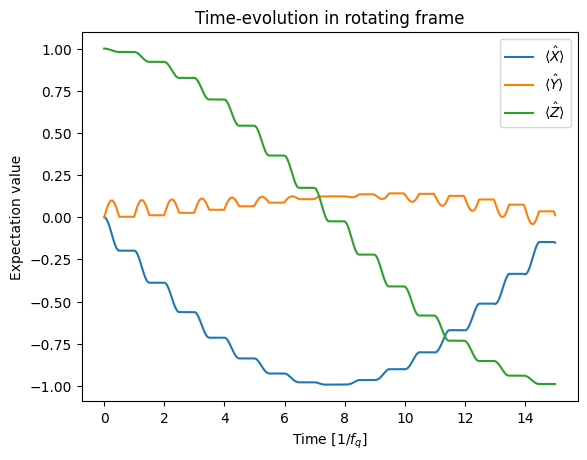

In [61]:
# acquire the eigenstates of the schrodinge eq (qubit state)
psi_lab = result.states
# calculate the rotating frame states by multiplying U_rf on psi_lab
psi_rf=[]
for time_idx, time in enumerate(time_list):
  oper=-1j*omega_z/2*time*sigmaz()
  U_rf=oper.expm()
  psi_rf.append(U_rf*psi_lab[time_idx])
# plot the expectation value of X
exp_x_rf = expect(sigmax(),psi_rf)
exp_y_rf = expect(sigmay(),psi_rf)
exp_z_rf = expect(sigmaz(),psi_rf)

plt.plot(time_list, exp_x_rf, label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y_rf, label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z_rf, label=r"$\langle\hat{Z}\rangle$")

plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")
plt.title("Time-evolution in rotating frame")

Time needed to reach XY plane :  392.74
Time needed to reach |1> state :  785.28
Time needed to reach |+> state :  392.5


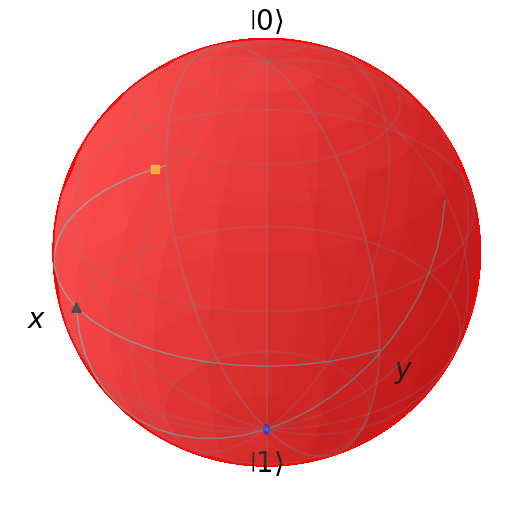

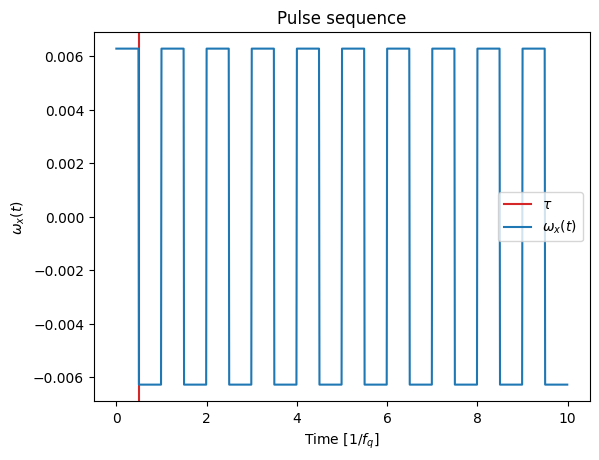

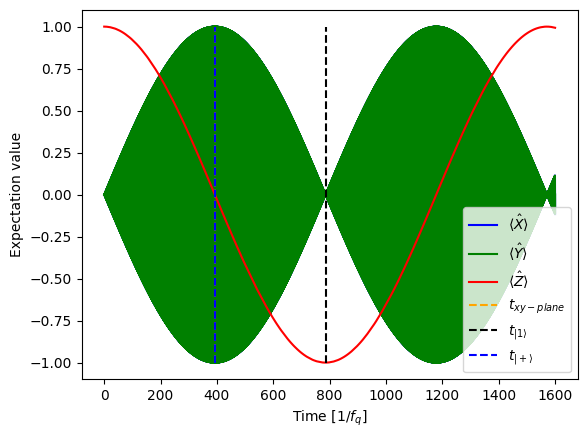

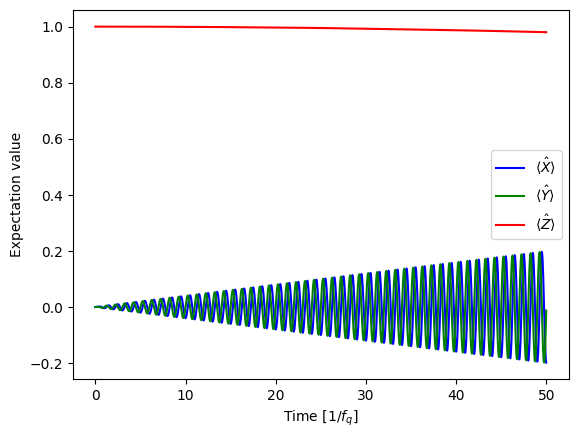

In [30]:
#Question 25 and 26
omega_z = 2*np.pi
time_list = np.linspace(0, 1600, 160001) 
g = omega_z/1000
tau = np.pi/omega_z
# Definition of the pulse shape (omega_x(t))
def omega_x(t):
    n=np.floor(t/tau)
    if n%2==0 :
        return g
    else:
        return -g

# Definition of the time-dependent Hamiltonian
H0 = -omega_z / 2 * sigmaz()
H1 = -1 / 2 * sigmax()
H = [H0, [H1, omega_x]]

# solve the Schrodinger equation
result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()],options={"store_states":True})

# plot the pulse sequence shape (omega_x(t))
plt.axvline(x=tau, color = "tab:red", label=r"$\tau$")
plt.plot(time_list[:1000], [omega_x(t) for t in time_list[:1000]], label=r"$\omega_x(t)$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel(r"$\omega_x(t)$")
plt.title("Pulse sequence")

# plot the time evolution of bloch vector
exp_x = result.expect[0]
exp_y = result.expect[1]
exp_z = result.expect[2]

#Find time when XY plane is reached
index_targetxy = (np.abs(exp_z)).argmin()
t_xyplane = time_list[index_targetxy]
print("Time needed to reach XY plane : ", t_xyplane)

#Find time when |1> is reached 
index_target1 = (np.abs(exp_z+1)).argmin()
t_1 = time_list[index_target1]
print("Time needed to reach |1> state : ", t_1)

#Find time when |+> is reached 
index_target45 = (np.abs(exp_x+1)).argmax()
t_45 = time_list[index_target45]
print("Time needed to reach |+> state : ", t_45)


plt.figure()
plt.plot(time_list, exp_x, color="blue", label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y, color="green", label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z, color="red", label=r"$\langle\hat{Z}\rangle$")
plt.vlines(t_xyplane, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="orange",label=r"$t_{xy-plane}$") 
plt.vlines(t_1, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="black",label=r"$t_{|1\rangle}$")
plt.vlines(t_45, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="blue",label=r"$t_{|+\rangle}$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")

plt.figure()
interval = 5000
plt.plot(time_list[:interval], exp_x[:interval], color="blue", label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list[:interval], exp_y[:interval], color="green", label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list[:interval], exp_z[:interval], color="red", label=r"$\langle\hat{Z}\rangle$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")

# plot on Bloch sphere
b = Bloch()
b.view = [-30, 30]
b.make_sphere()

# plot the time trace of the state
b.add_points(result.expect, meth="l", colors="red")
b.add_points([[exp_x[index_targetxy]], [exp_y[index_targetxy]], [exp_z[index_targetxy]]], meth="m", colors="orange")
b.add_points([[exp_x[index_target1]], [exp_y[index_target1]], [exp_z[index_target1]]], meth="m", colors="blue")
b.add_points([[exp_x[index_target45]], [exp_y[index_target45]], [exp_z[index_target45]]], meth="m", colors="black")
b.render()
b.show()


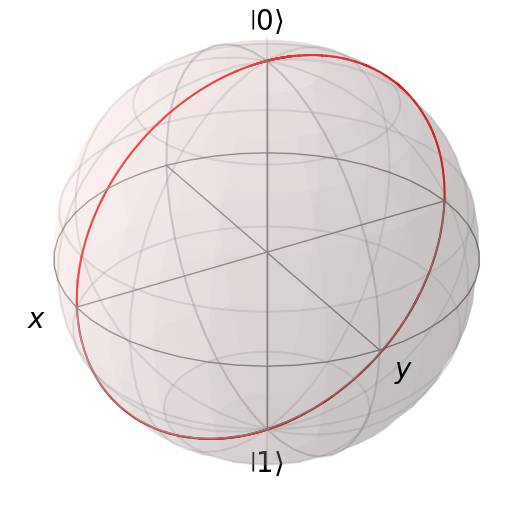

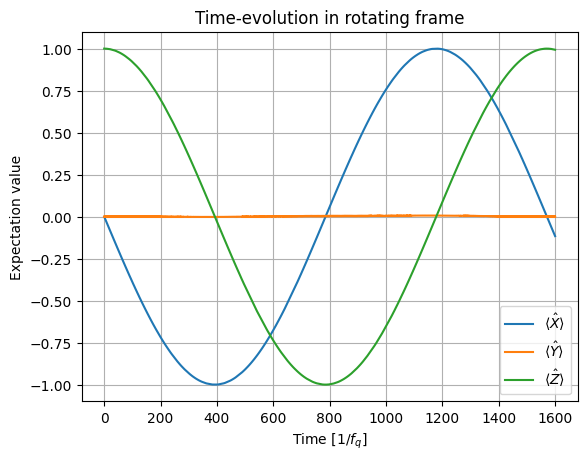

In [31]:
#Question 28 sans variation de tau
# acquire the eigenstates of the schrodinge eq (qubit state)
psi_lab = result.states
# calculate the rotating frame states by multiplying U_rf on psi_lab
psi_rf=[]
for time_idx, time in enumerate(time_list):
  oper=-1j*omega_z/2*time*sigmaz()
  U_rf=oper.expm()
  psi_rf.append(U_rf*psi_lab[time_idx])
# plot the expectation value of X
exp_x_rf = expect(sigmax(),psi_rf)
exp_y_rf = expect(sigmay(),psi_rf)
exp_z_rf = expect(sigmaz(),psi_rf)

plt.plot(time_list, exp_x_rf, label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y_rf, label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z_rf, label=r"$\langle\hat{Z}\rangle$")

plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")
plt.title("Time-evolution in rotating frame")
plt.grid()

b = Bloch()
b.view = [-30, 30]
b.make_sphere()

# plot the time trace of the state
b.add_points([exp_x_rf, exp_y_rf, exp_z_rf], meth="l", colors="red")
#b.add_points([[exp_x[index_targetxy]], [exp_y[index_targetxy]], [exp_z[index_targetxy]]], meth="m", colors="orange")
#b.add_points([[exp_x[index_target1]], [exp_y[index_target1]], [exp_z[index_target1]]], meth="m", colors="blue")
#b.add_points([[exp_x[index_target45]], [exp_y[index_target45]], [exp_z[index_target45]]], meth="m", colors="black")
b.render()
b.show()


tau equals to 0.5025


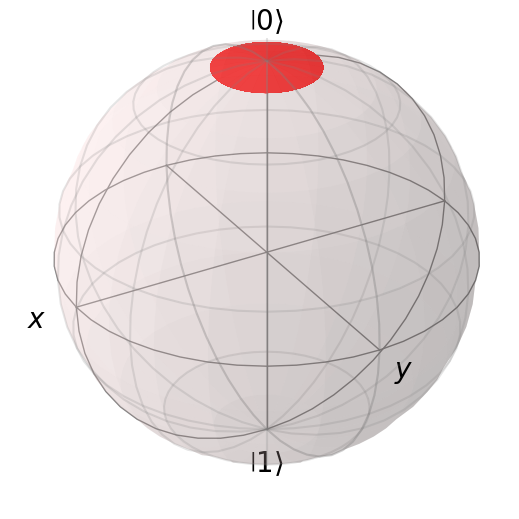

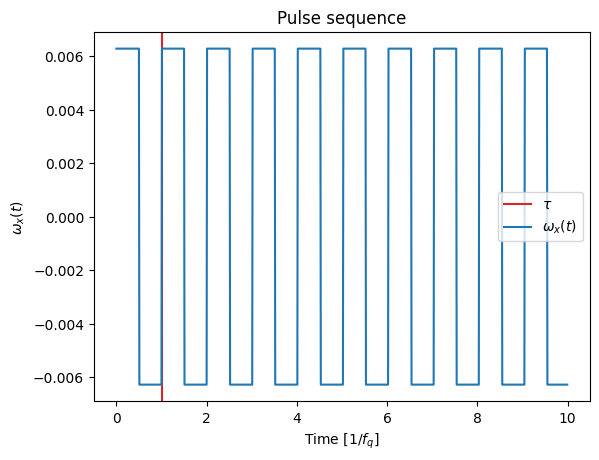

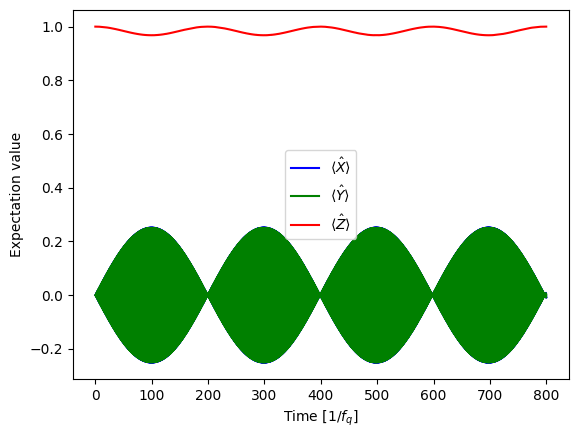

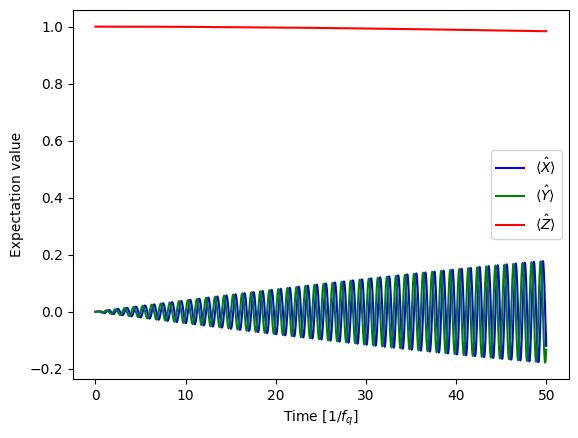

In [32]:
#Question 27 varier tau de 0.1-1%
omega_z = 2*np.pi
time_list = np.linspace(0, 800, 80001) 
g = omega_z/1000
tau = 1.005*np.pi/omega_z
print("tau equals to",tau)
# Definition of the pulse shape (omega_x(t))
def omega_x(t):
    n=np.floor(t/tau)
    if n%2==0 :
        return g
    else:
        return -g

# Definition of the time-dependent Hamiltonian
H0 = -omega_z / 2 * sigmaz()
H1 = -1 / 2 * sigmax()
H = [H0, [H1, omega_x]]

# solve the Schrodinger equation
result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()],options={"store_states":True})

# plot the pulse sequence shape (omega_x(t))
plt.axvline(x=2*tau, color = "tab:red", label=r"$\tau$")
plt.plot(time_list[:1000], [omega_x(t) for t in time_list[:1000]], label=r"$\omega_x(t)$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel(r"$\omega_x(t)$")
plt.title("Pulse sequence")

# plot the time evolution of bloch vector
exp_x = result.expect[0]
exp_y = result.expect[1]
exp_z = result.expect[2]

#Find time when XY plane is reached
#index_targetxy = (np.abs(exp_z)).argmin()
#t_xyplane = time_list[index_targetxy]
#print("Time needed to reach XY plane : ", t_xyplane)

#Find time when |1> is reached 
#index_target1 = (np.abs(exp_z+1)).argmin()
#t_1 = time_list[index_target1]
#print("Time needed to reach |1> state : ", t_1)

#Find time when |+> is reached 
#index_target45 = (np.abs(exp_x+1)).argmax()
#t_45 = time_list[index_target45]
#print("Time needed to reach |+> state : ", t_45)


plt.figure()
plt.plot(time_list, exp_x, color="blue", label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y, color="green", label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z, color="red", label=r"$\langle\hat{Z}\rangle$")
#plt.vlines(t_xyplane, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="orange",label=r"$t_{xy-plane}$") 
#plt.vlines(t_1, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="black",label=r"$t_{|1\rangle}$")
#plt.vlines(t_45, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="blue",label=r"$t_{|+\rangle}$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")

plt.figure()
interval = 5000
plt.plot(time_list[:interval], exp_x[:interval], color="blue", label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list[:interval], exp_y[:interval], color="green", label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list[:interval], exp_z[:interval], color="red", label=r"$\langle\hat{Z}\rangle$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")

# plot on Bloch sphere
b = Bloch()
b.view = [-30, 30]
b.make_sphere()

# plot the time trace of the state
b.add_points(result.expect, meth="l", colors="red")
#b.add_points([[exp_x[index_targetxy]], [exp_y[index_targetxy]], [exp_z[index_targetxy]]], meth="m", colors="orange")
#b.add_points([[exp_x[index_target1]], [exp_y[index_target1]], [exp_z[index_target1]]], meth="m", colors="blue")
#b.add_points([[exp_x[index_target45]], [exp_y[index_target45]], [exp_z[index_target45]]], meth="m", colors="black")
b.render()
b.show()


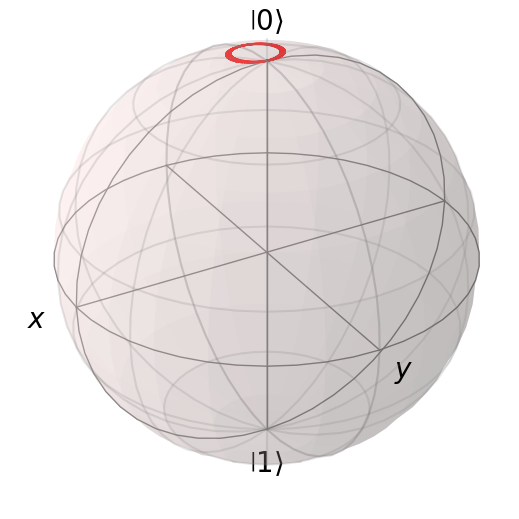

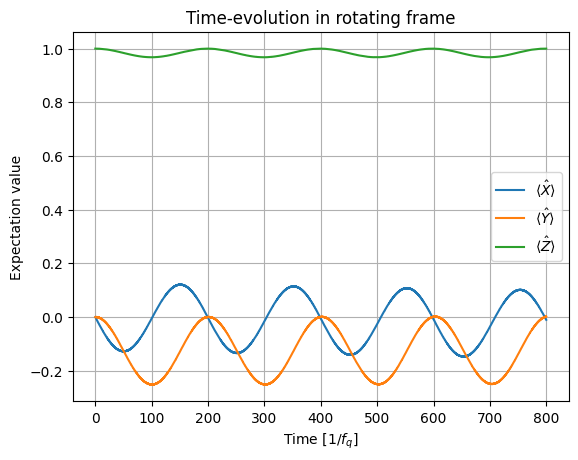

In [33]:
#Question 28 
# acquire the eigenstates of the schrodinge eq (qubit state)
psi_lab = result.states
# calculate the rotating frame states by multiplying U_rf on psi_lab
psi_rf=[]
for time_idx, time in enumerate(time_list):
  oper=-1j*omega_z/2*time*sigmaz()
  U_rf=oper.expm()
  psi_rf.append(U_rf*psi_lab[time_idx])
# plot the expectation value of X
exp_x_rf = expect(sigmax(),psi_rf)
exp_y_rf = expect(sigmay(),psi_rf)
exp_z_rf = expect(sigmaz(),psi_rf)

plt.plot(time_list, exp_x_rf, label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y_rf, label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z_rf, label=r"$\langle\hat{Z}\rangle$")

plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")
plt.title("Time-evolution in rotating frame")
plt.grid()

b = Bloch()
b.view = [-30, 30]
b.make_sphere()

# plot the time trace of the state
b.add_points([exp_x_rf, exp_y_rf, exp_z_rf], meth="l", colors="red")
#b.add_points([[exp_x[index_targetxy]], [exp_y[index_targetxy]], [exp_z[index_targetxy]]], meth="m", colors="orange")
#b.add_points([[exp_x[index_target1]], [exp_y[index_target1]], [exp_z[index_target1]]], meth="m", colors="blue")
#b.add_points([[exp_x[index_target45]], [exp_y[index_target45]], [exp_z[index_target45]]], meth="m", colors="black")
b.render()
b.show()


omega_q = 6.283185307179586
omega_d = 6.283185307179586
Time needed to reach |0> state :  0.0
Time needed to reach |1> state :  500.0
Time needed to reach |i> state :  250.0
Time needed to reach |-i> state :  750.0


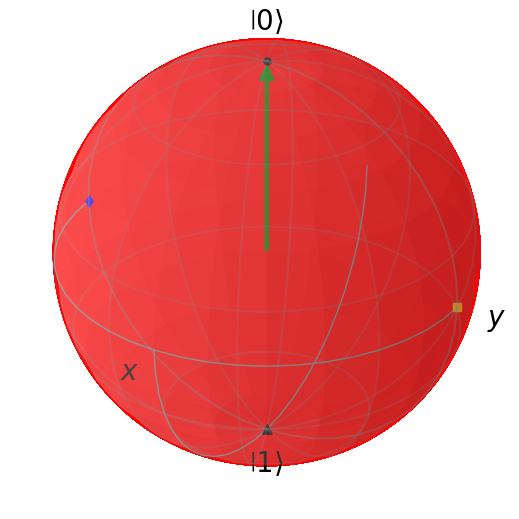

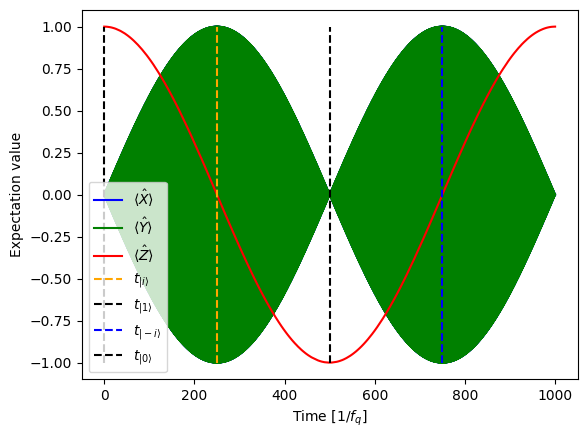

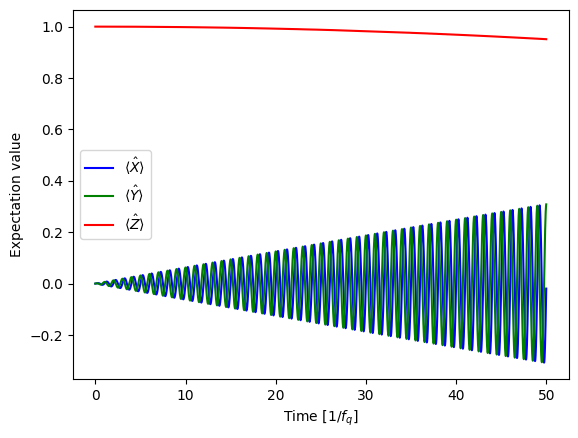

In [69]:
#Question 29
x0 = (basis(2,0)+(1+0j)*basis(2,1)).unit()
x1 = (basis(2,0)-(1+0j)*basis(2,1)).unit()
y0 = (basis(2,0)+(0+1j)*basis(2,1)).unit()
y1 = (basis(2,0)-(0+1j)*basis(2,1)).unit()
z0 = (basis(2,0)+(0+0j)*basis(2,1)).unit()
z1 = (0*basis(2,0)+(1+0j)*basis(2,1)).unit()

time_list = np.linspace(0, 1000, 100001) # [1/f_q] time points normalized by qubit freq
f_q = 1 # [] normalized qubit frequency
omega_q = 2*np.pi*f_q
omega_d = 2*np.pi*f_q # on-resonance drive
print("omega_q =", omega_q)
print("omega_d =", omega_d)

g = omega_q/1000

# definition of the initial state
psi0 = z0 # ground state in 2 level system

# Definition of the time-dependent Hamiltonian
H0 = -omega_q / 2 * sigmaz()
H1 = -g * sigmax()
H = [H0, [H1, lambda t: np.cos(omega_d*t)]]

# solve the Schrodinger equation
result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()],options={"store_states":True})

# plot the expectation value of X
exp_x = result.expect[0]
exp_y = result.expect[1]
exp_z = result.expect[2]

#Find time when |0> is reached 
index_target0 = (np.abs(exp_z+1)).argmax()
t_0 = time_list[index_target0]
print("Time needed to reach |0> state : ", t_0)

#Find time when |1> is reached 
index_target1 = (np.abs(exp_z+1)).argmin()
t_1 = time_list[index_target1]
print("Time needed to reach |1> state : ", t_1)

#Find time when |i> is reached 
index_targeti = (np.abs(exp_y+1)).argmax()
t_i = time_list[index_targeti]
print("Time needed to reach |i> state : ", t_i)

#Find time when |-i> is reached 
index_targetmi = (np.abs(exp_y+1)).argmin()
t_mi = time_list[index_targetmi]
print("Time needed to reach |-i> state : ", t_mi)


plt.figure()
plt.plot(time_list, exp_x, color="blue", label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y, color="green", label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z, color="red", label=r"$\langle\hat{Z}\rangle$")
plt.vlines(t_i, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="orange",label=r"$t_{|i\rangle}$") 
plt.vlines(t_1, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="black",label=r"$t_{|1\rangle}$")
plt.vlines(t_mi, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="blue",label=r"$t_{|-i\rangle}$")
plt.vlines(t_0, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="black",label=r"$t_{|0\rangle}$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")


plt.figure()
interval = 5000
plt.plot(time_list[:interval], exp_x[:interval], color="blue", label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list[:interval], exp_y[:interval], color="green", label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list[:interval], exp_z[:interval], color="red", label=r"$\langle\hat{Z}\rangle$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")


# plot on Bloch sphere
b = Bloch()
b.make_sphere()

# plot the time trace of the state
b.add_states([psi0])
b.add_points(result.expect, meth="l", colors="red")
b.add_points([[exp_x[index_targeti]], [exp_y[index_targeti]], [exp_z[index_targeti]]], meth="m", colors="orange")
b.add_points([[exp_x[index_targetmi]], [exp_y[index_targetmi]], [exp_z[index_targetmi]]], meth="m", colors="blue")
b.add_points([[exp_x[index_target1]], [exp_y[index_target1]], [exp_z[index_target1]]], meth="m", colors="black")
b.add_points([[exp_x[index_target0]], [exp_y[index_target0]], [exp_z[index_target0]]], meth="m", colors="black")
b.render()
b.show()




Time needed to reach |1> state :  500.0
Time needed to reach |i> state :  250.0
Time needed to reach |-i> state :  750.0


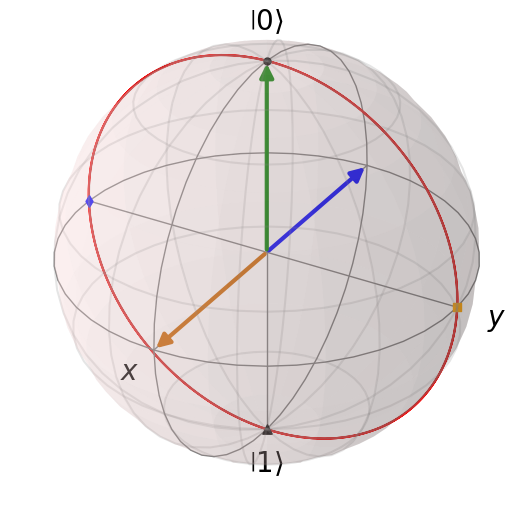

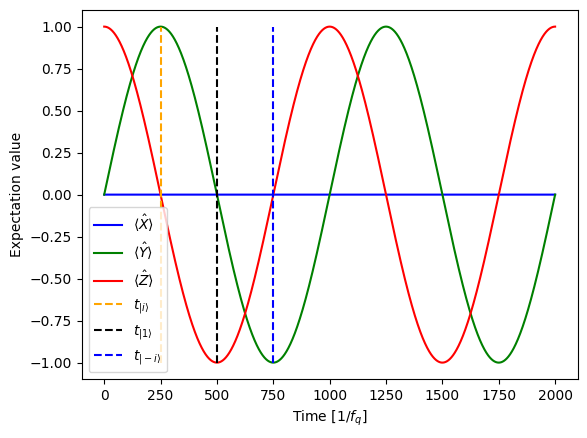

In [70]:
#Question 30
time_list = np.linspace(0, 2000, 200001) # [1/f_q] time points normalized by qubit freq
delta=omega_q-omega_d

# Definition of the ROTATING FRAME Hamiltonian
H = -delta/2 * sigmaz() - g/2 * sigmax()
eigvals, eigstates = H.eigenstates()
# solve the Schrodinger equation
result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()],options={"store_states":True})

# plot the expectation value of X
exp_x = result.expect[0]
exp_y = result.expect[1]
exp_z = result.expect[2]

#Find time when |0> is reached 
#index_target0 = (np.abs(exp_z+1)).argmax()
#t_0 = time_list[index_target0]
#print("Time needed to reach |0> state : ", t_0)

#Find time when |1> is reached 
index_target1 = (np.abs(exp_z+1)).argmin()
t_1 = time_list[index_target1]
print("Time needed to reach |1> state : ", t_1)

#Find time when |i> is reached 
index_targeti = (np.abs(exp_y+1)).argmax()
t_i = time_list[index_targeti]
print("Time needed to reach |i> state : ", t_i)

#Find time when |-i> is reached 
index_targetmi = (np.abs(exp_y+1)).argmin()
t_mi = time_list[index_targetmi]
print("Time needed to reach |-i> state : ", t_mi)

plt.figure()
plt.plot(time_list, exp_x, color="blue", label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y, color="green", label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z, color="red", label=r"$\langle\hat{Z}\rangle$")
plt.vlines(t_i, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="orange",label=r"$t_{|i\rangle}$") 
plt.vlines(t_1, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="black",label=r"$t_{|1\rangle}$")
plt.vlines(t_mi, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="blue",label=r"$t_{|-i\rangle}$")
#plt.vlines(t_0, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="black",label=r"$t_{|0\rangle}$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")


# plot on Bloch sphere
b = Bloch()
b.make_sphere()

# plot the time trace of the state
b.add_states([psi0])
b.add_states(eigstates)
b.add_points(result.expect, meth="l", colors="red")
b.add_points([[exp_x[index_targeti]], [exp_y[index_targeti]], [exp_z[index_targeti]]], meth="m", colors="orange")
b.add_points([[exp_x[index_targetmi]], [exp_y[index_targetmi]], [exp_z[index_targetmi]]], meth="m", colors="blue")
b.add_points([[exp_x[index_target1]], [exp_y[index_target1]], [exp_z[index_target1]]], meth="m", colors="black")
b.add_points([[exp_x[index_target0]], [exp_y[index_target0]], [exp_z[index_target0]]], meth="m", colors="black")
b.render()
b.show()

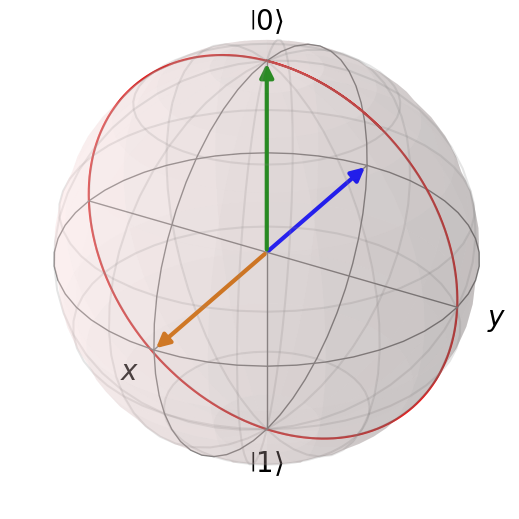

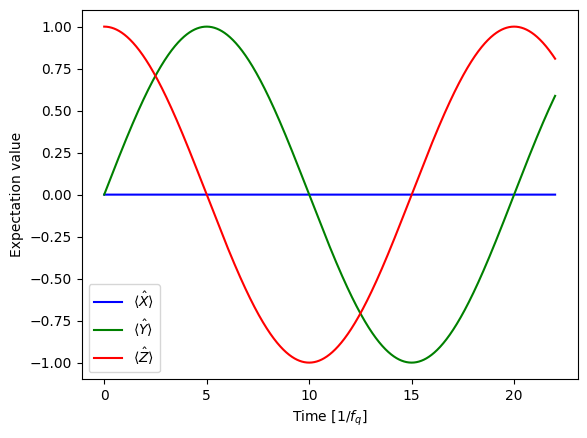

In [63]:
#Question 34
time_list = np.linspace(0, 22, 2001) # [1/f_q] time points normalized by qubit freq
f_q = 1 # [] normalized qubit frequency
omega_q = 2*np.pi*f_q
omega_d = 2*np.pi*f_q # on-resonance drive

g = omega_q/20

# definition of the initial state
psi0 = basis(2,0) # ground state in 2 level system

# Definition of the ROTATING FRAME Hamiltonian
H = -delta/2 * sigmaz() - g/2 * sigmax()
eigvals, eigstates = H.eigenstates()
# solve the Schrodinger equation
result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()],options={"store_states":True})

# plot the expectation value of X
exp_x = result.expect[0]
exp_y = result.expect[1]
exp_z = result.expect[2]

plt.plot(time_list, exp_x, color="blue", label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y, color="green", label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z, color="red", label=r"$\langle\hat{Z}\rangle$")

plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")

# plot on Bloch sphere
b = Bloch()
b.make_sphere()

# plot the time trace of the state
b.add_points(result.expect, meth="l", colors="red")
b.add_states([psi0])
b.add_states(eigstates)
b.render()
b.show()


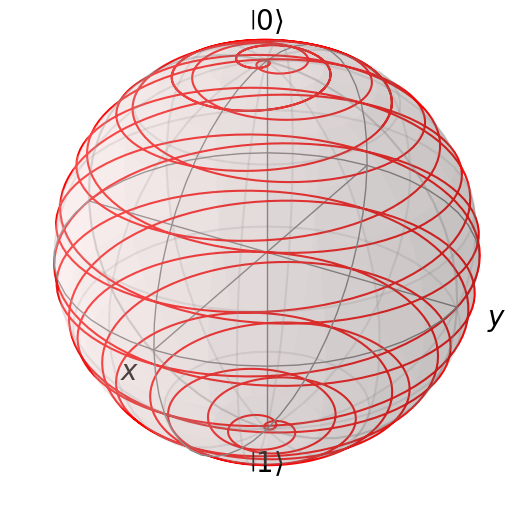

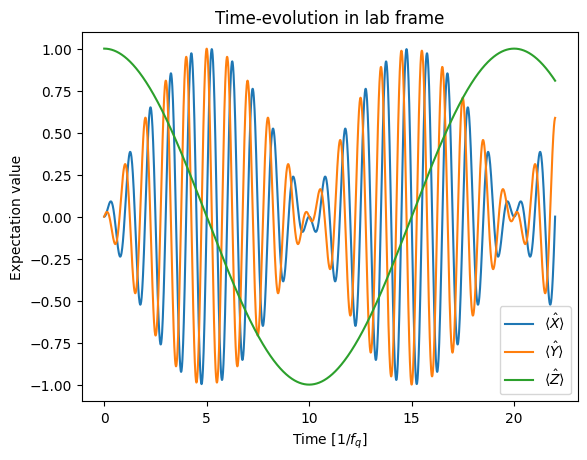

In [37]:
#Suite question 34 pour repasser dans le référentiel du labo

# acquire the eigenstates of the schrodinge eq (qubit state)
psi_rf = result.states
# calculate the rotating frame states by multiplying U_rf on psi_lab
psi_lab=[]
for time_idx, time in enumerate(time_list):
  oper=1j*omega_q/2*time*sigmaz()
  U_rf_inv=oper.expm()
  psi_lab.append(U_rf_inv*psi_rf[time_idx])


# plot the expectation value of X
exp_x_lab = expect(sigmax(),psi_lab)
exp_y_lab = expect(sigmay(),psi_lab)
exp_z_lab = expect(sigmaz(),psi_lab)

plt.plot(time_list, exp_x_lab, label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y_lab, label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z_lab, label=r"$\langle\hat{Z}\rangle$")

plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")
plt.title("Time-evolution in lab frame")

# plot on Bloch sphere
b = Bloch()
b.make_sphere()

# plot the time trace of the state
b.add_points([exp_x_lab, exp_y_lab, exp_z_lab], meth="l", colors="red")

b.render()
b.show()

omega_q = 6.283185307179586
omega_d = 6.283185307179586
Time needed to reach |0> state :  0.0
Time needed to reach |1> state :  10.00054
Time needed to reach |i> state :  5.00192
Time needed to reach |-i> state :  14.99806


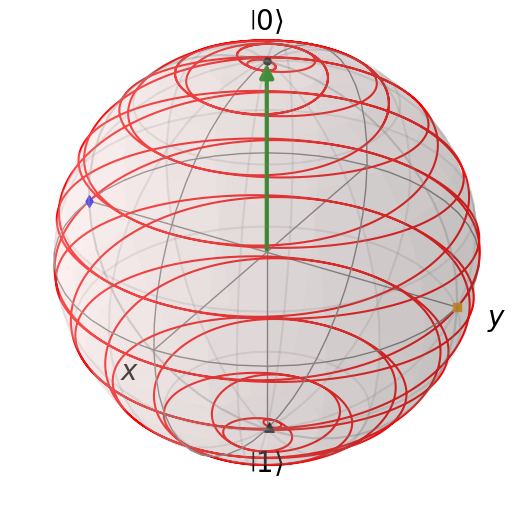

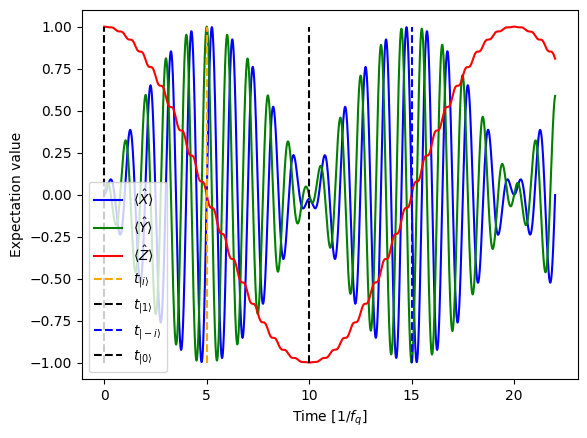

In [38]:
#Question 35
x0 = (basis(2,0)+(1+0j)*basis(2,1)).unit()
x1 = (basis(2,0)-(1+0j)*basis(2,1)).unit()
y0 = (basis(2,0)+(0+1j)*basis(2,1)).unit()
y1 = (basis(2,0)-(0+1j)*basis(2,1)).unit()
z0 = (basis(2,0)+(0+0j)*basis(2,1)).unit()
z1 = (0*basis(2,0)+(1+0j)*basis(2,1)).unit()

time_list = np.linspace(0, 22, 100001) # [1/f_q] time points normalized by qubit freq
f_q = 1 # [] normalized qubit frequency
omega_q = 2*np.pi*f_q
omega_d = 2*np.pi# on-resonance drive
print("omega_q =", omega_q)
print("omega_d =", omega_d)

g = omega_q / 20

# definition of the initial state
psi0 = z0 # ground state in 2 level system

# Definition of the time-dependent Hamiltonian
H0 = -omega_q / 2 * sigmaz()
H1 = -g * sigmax()
H = [H0, [H1, lambda t: np.cos(omega_d*t)]]

# solve the Schrodinger equation
result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()],options={"store_states":True})

# plot the expectation value of X
exp_x = result.expect[0]
exp_y = result.expect[1]
exp_z = result.expect[2]

#Find time when |0> is reached 
index_target0 = (np.abs(exp_z+1)).argmax()
t_0 = time_list[index_target0]
print("Time needed to reach |0> state : ", t_0)

#Find time when |1> is reached 
index_target1 = (np.abs(exp_z+1)).argmin()
t_1 = time_list[index_target1]
print("Time needed to reach |1> state : ", t_1)

#Find time when |i> is reached 
index_targeti = (np.abs(exp_y+1)).argmax()
t_i = time_list[index_targeti]
print("Time needed to reach |i> state : ", t_i)

#Find time when |-i> is reached 
index_targetmi = (np.abs(exp_y+1)).argmin()
t_mi = time_list[index_targetmi]
print("Time needed to reach |-i> state : ", t_mi)


plt.figure()
plt.plot(time_list, exp_x, color="blue", label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y, color="green", label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z, color="red", label=r"$\langle\hat{Z}\rangle$")
plt.vlines(t_i, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="orange",label=r"$t_{|i\rangle}$") 
plt.vlines(t_1, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="black",label=r"$t_{|1\rangle}$")
plt.vlines(t_mi, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="blue",label=r"$t_{|-i\rangle}$")
plt.vlines(t_0, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="black",label=r"$t_{|0\rangle}$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")


# plot on Bloch sphere
b = Bloch()
b.make_sphere()

# plot the time trace of the state
b.add_states([psi0])
b.add_points(result.expect, meth="l", colors="red")
b.add_points([[exp_x[index_targeti]], [exp_y[index_targeti]], [exp_z[index_targeti]]], meth="m", colors="orange")
b.add_points([[exp_x[index_targetmi]], [exp_y[index_targetmi]], [exp_z[index_targetmi]]], meth="m", colors="blue")
b.add_points([[exp_x[index_target1]], [exp_y[index_target1]], [exp_z[index_target1]]], meth="m", colors="black")
b.add_points([[exp_x[index_target0]], [exp_y[index_target0]], [exp_z[index_target0]]], meth="m", colors="black")
b.render()
b.show()



Time needed to reach |1> state :  9.99999
Time needed to reach |i> state :  5.00005
Time needed to reach |-i> state :  15.00004


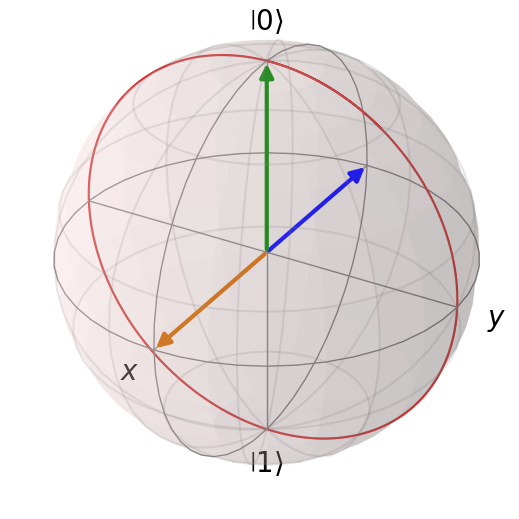

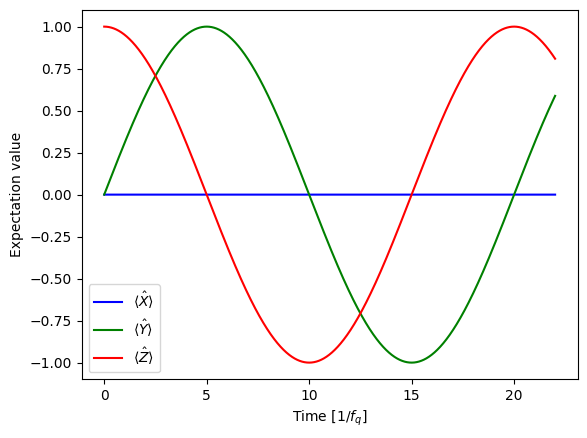

In [39]:
#Suite Question 35 rotating frame
time_list = np.linspace(0, 22, 200001) # [1/f_q] time points normalized by qubit freq
delta=omega_q-omega_d
#delta=100*g


# Definition of the ROTATING FRAME Hamiltonian
H = -delta/2 * sigmaz() - g/2 * sigmax()
eigvals, eigstates = H.eigenstates()
# solve the Schrodinger equation
result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()],options={"store_states":True})

# plot the expectation value of X
exp_x = result.expect[0]
exp_y = result.expect[1]
exp_z = result.expect[2]

#Find time when |0> is reached 
#index_target0 = (np.abs(exp_z+1)).argmax()
#t_0 = time_list[index_target0]
#print("Time needed to reach |0> state : ", t_0)

#Find time when |1> is reached 
index_target1 = (np.abs(exp_z+1)).argmin()
t_1 = time_list[index_target1]
print("Time needed to reach |1> state : ", t_1)

#Find time when |i> is reached 
index_targeti = (np.abs(exp_y+1)).argmax()
t_i = time_list[index_targeti]
print("Time needed to reach |i> state : ", t_i)

#Find time when |-i> is reached 
index_targetmi = (np.abs(exp_y+1)).argmin()
t_mi = time_list[index_targetmi]
print("Time needed to reach |-i> state : ", t_mi)

plt.figure()
plt.plot(time_list, exp_x, color="blue", label=r"$\langle\hat{X}\rangle$")
plt.plot(time_list, exp_y, color="green", label=r"$\langle\hat{Y}\rangle$")
plt.plot(time_list, exp_z, color="red", label=r"$\langle\hat{Z}\rangle$")
#plt.vlines(t_i, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="orange",label=r"$t_{|i\rangle}$") 
#plt.vlines(t_1, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="black",label=r"$t_{|1\rangle}$")
#plt.vlines(t_mi, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="blue",label=r"$t_{|-i\rangle}$")
#plt.vlines(t_0, np.min(result.expect), np.max(result.expect), linestyles="dashed", colors="black",label=r"$t_{|0\rangle}$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")


# plot on Bloch sphere
b = Bloch()
b.make_sphere()

# plot the time trace of the state
b.add_states([psi0])
b.add_states(eigstates)
b.add_points(result.expect, meth="l", colors="red")
#b.add_points([[exp_x[index_targeti]], [exp_y[index_targeti]], [exp_z[index_targeti]]], meth="m", colors="orange")
#b.add_points([[exp_x[index_targetmi]], [exp_y[index_targetmi]], [exp_z[index_targetmi]]], meth="m", colors="blue")
#b.add_points([[exp_x[index_target1]], [exp_y[index_target1]], [exp_z[index_target1]]], meth="m", colors="black")
#b.add_points([[exp_x[index_target0]], [exp_y[index_target0]], [exp_z[index_target0]]], meth="m", colors="black")
b.render()
b.show()

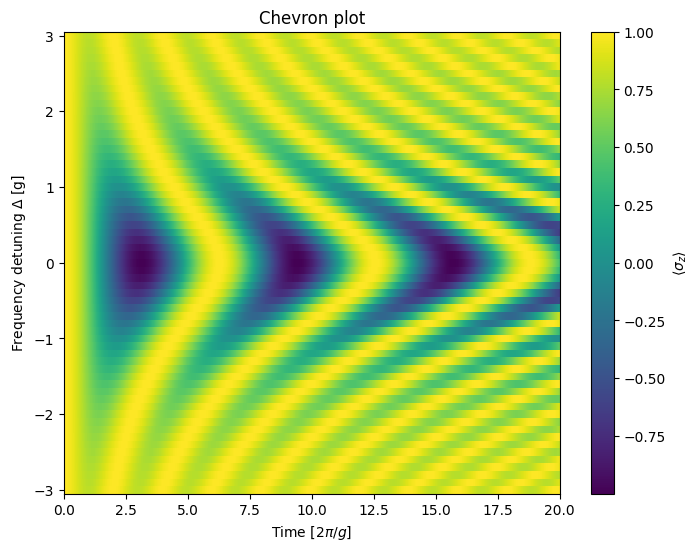

In [40]:
#Question 36 Chevron plot
# Parameters
time_list = np.linspace(0, 20, 2001)  # [2pi/g] time points normalized by coupling
g = 1  # normalized coupling
delta_list = np.linspace(-3, 3, 61)  # detuning (normalized by coupling g)

# Initialize an empty list to store the data
data = []

# Loop over detuning values (delta)
for delta in delta_list:
    # Initial state: ground state of the 2-level system
    psi0 = basis(2, 0)

    # Define the rotating-frame Hamiltonian
    H = -delta/2 * sigmaz() - g/2 * sigmax()

    # Solve the Schrodinger equation and obtain the expectation value of sigma_z
    result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmaz()])

    # Append the expectation values to the data list
    data.append(result.expect[0])

# Convert the data list into a 2D NumPy array
data = np.array(data)

# Create the 2D color plot
plt.figure(figsize=(8, 6))
plt.pcolormesh(time_list, delta_list, data, shading='auto', cmap='viridis')
plt.colorbar(label=r'$\langle \sigma_z \rangle$')

# Labels and title
plt.xlabel(r'Time [$2\pi/g$]')
plt.ylabel(r'Frequency detuning $\Delta$ [g]')
plt.title(r'Chevron plot')

# Show the plot
plt.show()


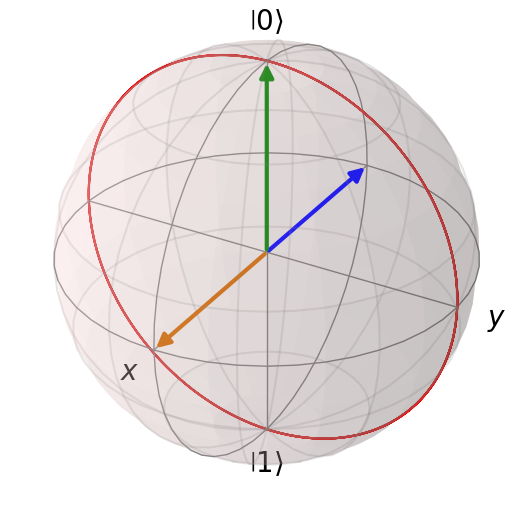

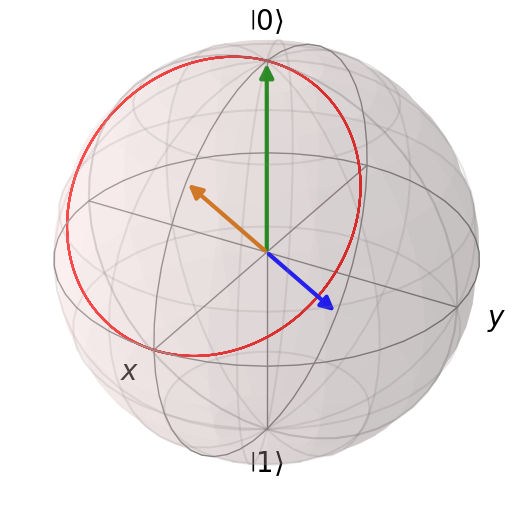

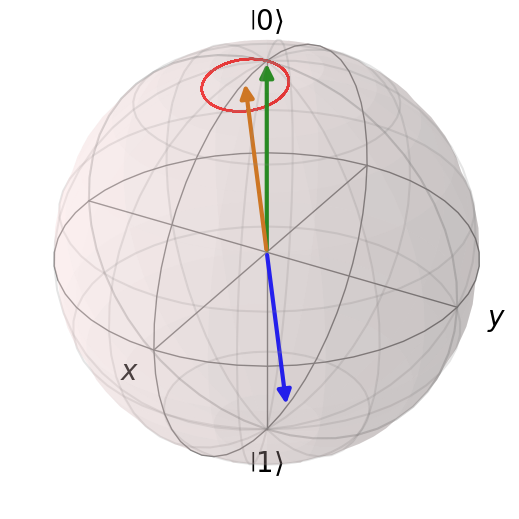

Dominant frequency: 0.182 [f_q]
Dominant angular frequency : 1.142 [f_q]


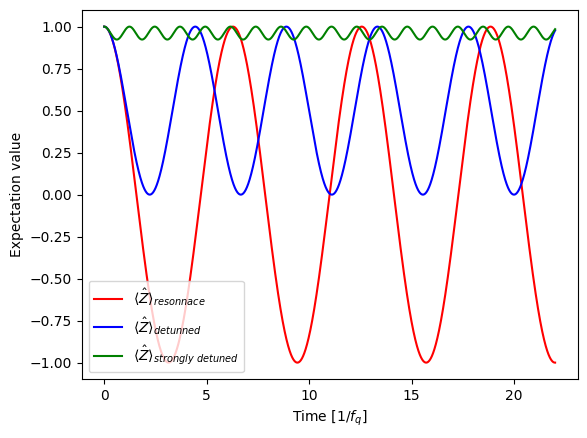

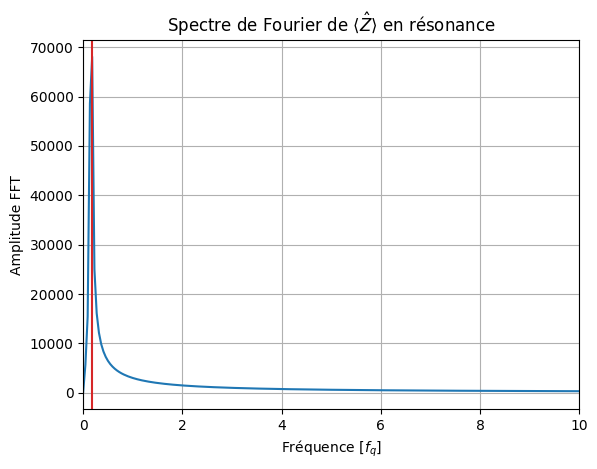

In [41]:
#Suite Question 36 rotating frame graphes to compare
time_list = np.linspace(0, 22, 200001) # [1/f_q] time points normalized by qubit freq
delta0=0
g=1

# Definition of the ROTATING FRAME Hamiltonian
H0 = -delta0/2 * sigmaz() - g/2 * sigmax()
eigvals0, eigstates0 = H0.eigenstates()
# solve the Schrodinger equation
result0 = mesolve(H=H0, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()],options={"store_states":True})



delta1=1

# Definition of the ROTATING FRAME Hamiltonian
H1 = -delta1/2 * sigmaz() - g/2 * sigmax()
eigvals1, eigstates1 = H1.eigenstates()
# solve the Schrodinger equation
result1 = mesolve(H=H1, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()],options={"store_states":True})


delta2=5

# Definition of the ROTATING FRAME Hamiltonian
H2 = -delta2/2 * sigmaz() - g/2 * sigmax()
eigvals2, eigstates2 = H2.eigenstates()
# solve the Schrodinger equation
result2 = mesolve(H=H2, rho0=psi0, tlist=time_list, e_ops=[sigmax(), sigmay(), sigmaz()],options={"store_states":True})


# plot the expectation value of Z
exp_z0 = result0.expect[2]
exp_z1 = result1.expect[2]
exp_z2 = result2.expect[2]


plt.figure()
plt.plot(time_list, exp_z0, color="red", label=r"$\langle\hat{Z}\rangle_{resonnace}$")
plt.plot(time_list, exp_z1, color="blue", label=r"$\langle\hat{Z}\rangle_{detunned}$")
plt.plot(time_list, exp_z2, color="green", label=r"$\langle\hat{Z}\rangle_{strongly\ detuned}$")
plt.legend(loc=0)
plt.xlabel(r"Time [1/$f_q$]")
plt.ylabel("Expectation value")


# plot on Bloch sphere
b0 = Bloch()
b0.make_sphere()

# plot the time trace of the state
b0.add_states([psi0])
b0.add_states(eigstates0)
b0.add_points(result0.expect, meth="l", colors="red")
b0.render()
b0.show()



# plot on Bloch sphere
b1 = Bloch()
b1.make_sphere()

# plot the time trace of the state
b1.add_states([psi0])
b1.add_states(eigstates1)
b1.add_points(result1.expect, meth="l", colors="red")
b1.render()
b1.show()



# plot on Bloch sphere
b2 = Bloch()
b2.make_sphere()

# plot the time trace of the state
b2.add_states([psi0])
b2.add_states(eigstates2)
b2.add_points(result2.expect, meth="l", colors="red")
b2.render()
b2.show()


# Calculer la FFT de la courbe rouge
n = len(time_list)  # Nombre de points
dt = time_list[1] - time_list[0]  # Intervalle de temps entre les points
frequencies = np.fft.fftfreq(n, dt)  # Fréquences associées à la FFT
fft_values = np.fft.fft(exp_z0)  # FFT de l'expectation value

# Prendre le module de la FFT (amplitude) et ne garder que la moitié du spectre (positif)
fft_amplitudes = np.abs(fft_values[:n // 2])
frequencies = frequencies[:n // 2]  # On ne prend que les fréquences positives

# Trouver la fréquence dominante
dominant_frequency = frequencies[np.argmax(fft_amplitudes)]
dominant_pulsation = 2*np.pi*dominant_frequency

# Afficher la fréquence dominante
print(f"Dominant frequency: {dominant_frequency:.3f} [f_q]")
print(f"Dominant angular frequency : {dominant_pulsation:.3f} [f_q]")

plt.figure()
plt.plot(frequencies, fft_amplitudes)
plt.axvline(x=dominant_frequency, color = "tab:red", label=r"$\f_{rabi}$")
plt.xlim(0, 10) 
plt.xlabel(r'Fréquence [$f_q$]')
plt.ylabel('Amplitude FFT')
plt.title(r'Spectre de Fourier de $\langle \hat{Z} \rangle$ en résonance')
plt.grid()
plt.show()


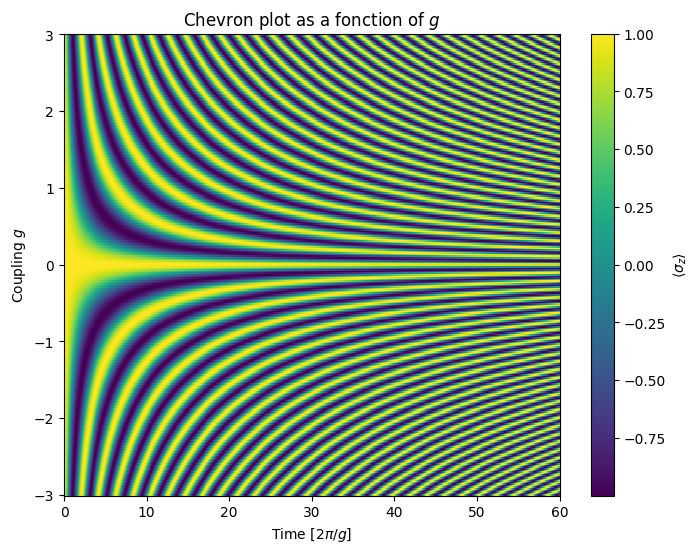

In [42]:
#Question 37
# Paramètres
time_list = np.linspace(0, 60, 1001)  # Points de temps [2pi/g]
g_list = np.linspace(-3, 3, 300)  # Liste des valeurs de g
delta = 0  # Résonance: omega = omega_d

# Initialisation d'une liste pour stocker les données
data = []

# Boucle sur les valeurs de g (couplage)
for g in g_list:
    # État initial: état fondamental du système à deux niveaux
    psi0 = basis(2, 0)

    # Définition de l'Hamiltonien dans le référentiel tournant
    H = -delta/2 * sigmaz() - g/2 * sigmax()

    # Résolution de l'équation de Schrödinger pour obtenir la valeur d'attente de sigma_z
    result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmaz()])

    # Ajout des valeurs d'attente dans la liste de données
    data.append(result.expect[0])

# Conversion de la liste de données en un tableau NumPy 2D
data = np.array(data)

# Création du graphique 2D en couleur (chevron plot)
plt.figure(figsize=(8, 6))
plt.pcolormesh(time_list, g_list, data, shading='auto', cmap='viridis')
plt.colorbar(label=r'$\langle \sigma_z \rangle$')

# Étiquettes et titre
plt.xlabel(r'Time [$2\pi/g$]')
plt.ylabel(r'Coupling $g$')
plt.title(r'Chevron plot as a fonction of $g$')

# Affichage du graphique
plt.show()


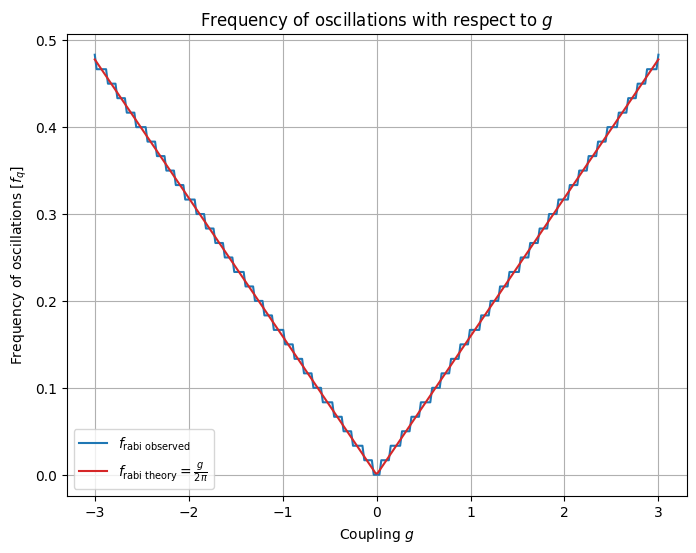

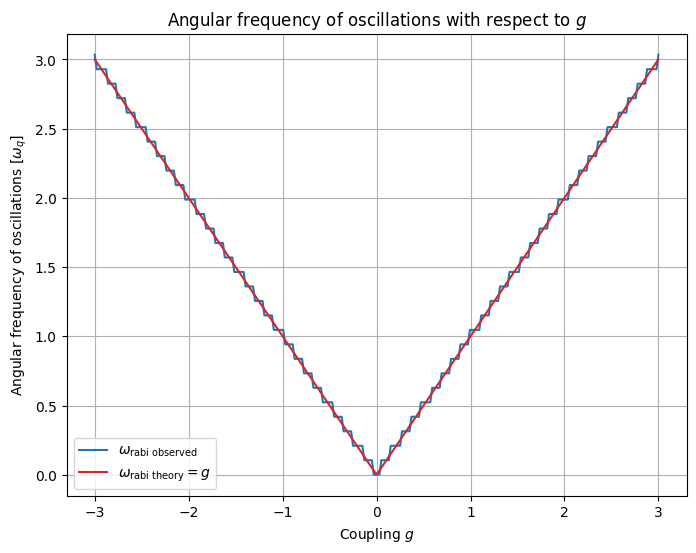

In [43]:
#Question 37 suite
# Paramètres
time_list = np.linspace(0, 60, 1001)  # Points de temps [2pi/g]
g_list = np.linspace(-3, 3, 300)  # Liste des valeurs de g
delta = 0  # Résonance: omega = omega_d

# Liste pour stocker les fréquences d'oscillation
frequencies = []

# Boucle sur les valeurs de g
for g in g_list:
    # État initial: état fondamental du système à deux niveaux
    psi0 = basis(2, 0)

    # Définition de l'Hamiltonien dans le référentiel tournant
    H = -delta/2 * sigmaz() - g/2 * sigmax()

    # Résolution de l'équation de Schrödinger pour obtenir la valeur d'attente de sigma_z
    result = mesolve(H=H, rho0=psi0, tlist=time_list, e_ops=[sigmaz()])
    exp_values = result.expect[0]

    # Calcul de la FFT de l'évolution de <Z>
    n = len(time_list)
    dt = time_list[1] - time_list[0]
    fft_values = np.fft.fft(exp_values)
    frequencies_fft = np.fft.fftfreq(n, dt)

    # Prendre le module de la FFT et ne garder que les fréquences positives
    fft_amplitudes = np.abs(fft_values[:n // 2])
    frequencies_fft = frequencies_fft[:n // 2]

    # Trouver la fréquence dominante
    dominant_frequency = frequencies_fft[np.argmax(fft_amplitudes)]
    frequencies.append(dominant_frequency)

# Tracé de la fréquence en fonction de g
plt.figure(figsize=(8, 6))
plt.plot(g_list, frequencies, '-', label=r"$f_\text{rabi\ observed}$")
plt.plot(g_list, np.abs(g_list/(2*np.pi)),color = "tab:red", label=r"$f_\text{rabi\ theory} = \frac{g}{2\pi}$")
plt.legend(loc=0)
plt.xlabel('Coupling $g$')
plt.ylabel('Frequency of oscillations [$f_q$]')
plt.title('Frequency of oscillations with respect to $g$')
plt.grid()
plt.show()

plt.figure(figsize=(8, 6))
# Convertir les fréquences observées en pulsations : ω_observed = 2π * f_observed
pulsations_observed = 2 * np.pi * np.array(frequencies)

# Courbe de la pulsation observée
plt.plot(g_list, pulsations_observed, '-', label=r"$\omega_\text{rabi\ observed}$")

# Courbe théorique : ω_theory = g
plt.plot(g_list, np.abs(g_list), color = "tab:red", label=r"$\omega_\text{rabi\ theory} = g$")

# Ajouter la légende, les axes, et le titre
plt.legend(loc=0)
plt.xlabel('Coupling $g$')
plt.ylabel('Angular frequency of oscillations [$\omega_q$]')
plt.title('Angular frequency of oscillations with respect to $g$')
plt.grid()
plt.show()
